This notebook was used to compile all of the available data from the Utah Flux Network stations.  It should only need to be used once, as other notebooks are used to comile the newer data.

# Initialization

## Import Standard Libraries

In [2]:
import pandas as pd
import numpy as np
import os
import geopandas as gpd
import sys
import pathlib
import glob

import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
#from urllib.parse import quote
#from sqlalchemy import create_engine
#import configparser


#import statsmodels.api as sm
#import pingouin as pg



## Import Micromet

In [4]:
sys.path.append("../../src/")
import micromet
import micromet.add_header_from_peer as ahp 

%matplotlib inline




## Initialize Logger

In [5]:
import logging
logger = logging.getLogger(__name__)
logger.setLevel(logging.DEBUG)
ch = logging.StreamHandler()
ch.setFormatter(
    logging.Formatter(
        fmt="%(levelname)s [%(asctime)s] %(name)s – %(message)s",
        datefmt="%Y-%m-%d %H:%M:%S",
    )
)
logger.addHandler(ch)

## Define the root folder for the data

In [6]:
raw_fold = pathlib.Path(f'G:/Shared drives/UGS_Flux/Data_Downloads/compiled')

# Run Compilation

Define the site folders and stations

In [7]:
site_folders = {'US-UTD':'Dugout_Ranch',
                'US-UTB':'BSF',
                'US-UTJ':'Bluff',
                'US-UTW':'Wellington',
                'US-UTE':'Escalante',
                'US-UTM':'Matheson',
                'US-UTP':'Phrag',
                'US-CdM':'Cedar_mesa',
                'US-UTV':'Desert_View_Myton',
                'US-UTN':'Juab',
                'US-UTG':'Green_River',
                'US-UTL':'Pelican_Lake',
                }

## Compile Met Statistics Tables

In [102]:

stats = {}
for key, value in site_folders.items():
    print(f"Processing site: {key} - {value}")
    parent_fold = raw_fold / f"{key}" / "Statistics"
    am_df = {}
    i=0
    #raw_data = micromet.raw_file_compile(raw_fold, parent_fold, search_str = "TOA5*Statistics*.dat")    
    for file_name in parent_fold.glob("TOA5*Statistics*.dat"):
        i += 1
        #print(f"Processing file: {file_name}")
        sts = pd.read_csv(file_name, skiprows = [0,2,3])
        for col in sts.columns:
            if col.endswith("_Avg"):
                sts.rename(columns={col: col[:-4]}, inplace=True)
            elif col.endswith("_Tot"):
                sts.rename(columns={col: col[:-4]}, inplace=True)
        sts['TIMESTAMP'] = pd.to_datetime(sts['TIMESTAMP'])
        sts['datetime_start'] = sts['TIMESTAMP']
        sts["TIMESTAMP_START"] = sts["TIMESTAMP"].apply(lambda x: f"{x:%Y%m%d%H%M}")
        am_data = micromet.Reformatter(drop_soil=False,
                                        logger=logger,
                                        )
        #raw_data = raw_data.drop([0], axis=0)
        df, report = am_data.prepare(sts, data_type="met")
        am_df[file_name.stem] = df
    if i > 0:
        stats[key] = pd.concat(am_df, ignore_index=True)
stats_met = pd.concat(stats)
stats_met.to_parquet(raw_fold / "comp_met_stat.parquet")


INFO [2025-08-08 19:06:40] __main__ – Starting reformat (776 rows)
INFO [2025-08-08 19:06:40] __main__ – Starting reformat (776 rows)
INFO [2025-08-08 19:06:40] __main__ – Starting reformat (776 rows)
INFO [2025-08-08 19:06:40] __main__ – Starting reformat (776 rows)
INFO [2025-08-08 19:06:40] __main__ – Starting reformat (776 rows)
INFO [2025-08-08 19:06:40] __main__ – Starting reformat (776 rows)
DEBUG [2025-08-08 19:06:40] __main__ – TS col TIMESTAMP_START
DEBUG [2025-08-08 19:06:40] __main__ – TS col TIMESTAMP_START
DEBUG [2025-08-08 19:06:40] __main__ – TS col TIMESTAMP_START
DEBUG [2025-08-08 19:06:40] __main__ – TS col TIMESTAMP_START
DEBUG [2025-08-08 19:06:40] __main__ – TS col TIMESTAMP_START
DEBUG [2025-08-08 19:06:40] __main__ – TS col TIMESTAMP_START
DEBUG [2025-08-08 19:06:40] __main__ – TIMESTAMP_START col 202407142030
DEBUG [2025-08-08 19:06:40] __main__ – TIMESTAMP_START col 202407142030
DEBUG [2025-08-08 19:06:40] __main__ – TIMESTAMP_START col 202407142030
DEBUG [202

Processing site: US-UTD - Dugout_Ranch


DEBUG [2025-08-08 19:06:40] __main__ – Setting number types T_nr_out
DEBUG [2025-08-08 19:06:40] __main__ – Setting number types sn500_heater_secs
DEBUG [2025-08-08 19:06:40] __main__ – Setting number types sn500_heater_secs
DEBUG [2025-08-08 19:06:40] __main__ – Setting number types sn500_heater_secs
DEBUG [2025-08-08 19:06:40] __main__ – Setting number types sn500_heater_secs
DEBUG [2025-08-08 19:06:40] __main__ – Setting number types sn500_heater_secs
DEBUG [2025-08-08 19:06:40] __main__ – Setting number types sn500_heater_secs
DEBUG [2025-08-08 19:06:40] __main__ – Setting number types T_CANOPY
DEBUG [2025-08-08 19:06:40] __main__ – Setting number types T_CANOPY
DEBUG [2025-08-08 19:06:40] __main__ – Setting number types T_CANOPY
DEBUG [2025-08-08 19:06:40] __main__ – Setting number types T_CANOPY
DEBUG [2025-08-08 19:06:40] __main__ – Setting number types T_CANOPY
DEBUG [2025-08-08 19:06:40] __main__ – Setting number types T_CANOPY
DEBUG [2025-08-08 19:06:40] __main__ – Setting nu

Processing site: US-UTB - BSF
Processing site: US-UTJ - Bluff


DEBUG [2025-08-08 19:07:16] __main__ – Setting number types LW_OUT_1_1_2
DEBUG [2025-08-08 19:07:16] __main__ – Setting number types LW_OUT_1_1_2
DEBUG [2025-08-08 19:07:16] __main__ – Setting number types T_nr
DEBUG [2025-08-08 19:07:16] __main__ – Setting number types T_nr
DEBUG [2025-08-08 19:07:16] __main__ – Setting number types T_nr
DEBUG [2025-08-08 19:07:16] __main__ – Setting number types T_nr
DEBUG [2025-08-08 19:07:16] __main__ – Setting number types T_nr
DEBUG [2025-08-08 19:07:16] __main__ – Setting number types T_nr
DEBUG [2025-08-08 19:07:16] __main__ – Setting number types T_nr_out
DEBUG [2025-08-08 19:07:16] __main__ – Setting number types T_nr_out
DEBUG [2025-08-08 19:07:16] __main__ – Setting number types T_nr_out
DEBUG [2025-08-08 19:07:16] __main__ – Setting number types T_nr_out
DEBUG [2025-08-08 19:07:16] __main__ – Setting number types T_nr_out
DEBUG [2025-08-08 19:07:16] __main__ – Setting number types T_nr_out
DEBUG [2025-08-08 19:07:16] __main__ – Setting num

Processing site: US-UTW - Wellington
Processing site: US-UTE - Escalante


DEBUG [2025-08-08 19:07:26] __main__ – Len of normalized prefix cols 554
DEBUG [2025-08-08 19:07:26] __main__ – Len of normalized prefix cols 554
DEBUG [2025-08-08 19:07:26] __main__ – Len of normalized prefix cols 554
DEBUG [2025-08-08 19:07:26] __main__ – Len of normalized prefix cols 554
DEBUG [2025-08-08 19:07:26] __main__ – Len of normalized prefix cols 554
DEBUG [2025-08-08 19:07:26] __main__ – Len of normalized prefix cols 554
DEBUG [2025-08-08 19:07:26] __main__ – Len of renamed cols 554
DEBUG [2025-08-08 19:07:26] __main__ – Len of renamed cols 554
DEBUG [2025-08-08 19:07:26] __main__ – Len of renamed cols 554
DEBUG [2025-08-08 19:07:26] __main__ – Len of renamed cols 554
DEBUG [2025-08-08 19:07:26] __main__ – Len of renamed cols 554
DEBUG [2025-08-08 19:07:26] __main__ – Len of renamed cols 554
DEBUG [2025-08-08 19:07:26] __main__ – Setting number types:    RECORD NETRAD_1_1_2  ALB_1_1_2 SW_IN_1_1_2 SW_OUT_1_1_2 LW_IN_1_1_2  \
0       0          NAN          0         NAN    

Processing site: US-UTM - Matheson
Processing site: US-UTP - Phrag
Processing site: US-CdM - Cedar_mesa


DEBUG [2025-08-08 19:07:47] __main__ – Setting number types T_10cm
DEBUG [2025-08-08 19:07:47] __main__ – Setting number types T_10cm
DEBUG [2025-08-08 19:07:47] __main__ – Setting number types T_10cm
DEBUG [2025-08-08 19:07:47] __main__ – Setting number types T_10cm
DEBUG [2025-08-08 19:07:47] __main__ – Setting number types T_10cm
DEBUG [2025-08-08 19:07:48] __main__ – Setting number types EC_10cm
DEBUG [2025-08-08 19:07:48] __main__ – Setting number types EC_10cm
DEBUG [2025-08-08 19:07:48] __main__ – Setting number types EC_10cm
DEBUG [2025-08-08 19:07:48] __main__ – Setting number types EC_10cm
DEBUG [2025-08-08 19:07:48] __main__ – Setting number types EC_10cm
DEBUG [2025-08-08 19:07:48] __main__ – Setting number types EC_10cm
DEBUG [2025-08-08 19:07:48] __main__ – Setting number types SWC_20cm
DEBUG [2025-08-08 19:07:48] __main__ – Setting number types SWC_20cm
DEBUG [2025-08-08 19:07:48] __main__ – Setting number types SWC_20cm
DEBUG [2025-08-08 19:07:48] __main__ – Setting num

Processing site: US-UTV - Desert_View_Myton


DEBUG [2025-08-08 19:08:08] __main__ – Setting number types SW_OUT_1_1_2
DEBUG [2025-08-08 19:08:08] __main__ – Setting number types SW_OUT_1_1_2
DEBUG [2025-08-08 19:08:08] __main__ – Setting number types LW_IN_1_1_2
DEBUG [2025-08-08 19:08:08] __main__ – Setting number types LW_IN_1_1_2
DEBUG [2025-08-08 19:08:08] __main__ – Setting number types LW_IN_1_1_2
DEBUG [2025-08-08 19:08:08] __main__ – Setting number types LW_IN_1_1_2
DEBUG [2025-08-08 19:08:08] __main__ – Setting number types LW_IN_1_1_2
DEBUG [2025-08-08 19:08:08] __main__ – Setting number types LW_IN_1_1_2
DEBUG [2025-08-08 19:08:08] __main__ – Setting number types LW_OUT_1_1_2
DEBUG [2025-08-08 19:08:08] __main__ – Setting number types LW_OUT_1_1_2
DEBUG [2025-08-08 19:08:08] __main__ – Setting number types LW_OUT_1_1_2
DEBUG [2025-08-08 19:08:08] __main__ – Setting number types LW_OUT_1_1_2
DEBUG [2025-08-08 19:08:08] __main__ – Setting number types LW_OUT_1_1_2
DEBUG [2025-08-08 19:08:08] __main__ – Setting number typ

Processing site: US-UTN - Juab
Processing site: US-UTG - Green_River


DEBUG [2025-08-08 19:08:25] __main__ – Setting number types T_nr
DEBUG [2025-08-08 19:08:25] __main__ – Setting number types T_nr
DEBUG [2025-08-08 19:08:25] __main__ – Setting number types T_nr_out
DEBUG [2025-08-08 19:08:25] __main__ – Setting number types T_nr_out
DEBUG [2025-08-08 19:08:25] __main__ – Setting number types T_nr_out
DEBUG [2025-08-08 19:08:25] __main__ – Setting number types T_nr_out
DEBUG [2025-08-08 19:08:25] __main__ – Setting number types T_nr_out
DEBUG [2025-08-08 19:08:25] __main__ – Setting number types T_nr_out
DEBUG [2025-08-08 19:08:25] __main__ – Setting number types sn500_heater_secs
DEBUG [2025-08-08 19:08:25] __main__ – Setting number types sn500_heater_secs
DEBUG [2025-08-08 19:08:25] __main__ – Setting number types sn500_heater_secs
DEBUG [2025-08-08 19:08:25] __main__ – Setting number types sn500_heater_secs
DEBUG [2025-08-08 19:08:25] __main__ – Setting number types sn500_heater_secs
DEBUG [2025-08-08 19:08:25] __main__ – Setting number types sn500_

Processing site: US-UTL - Pelican_Lake


DEBUG [2025-08-08 19:08:39] __main__ – Setting number types RECORD
DEBUG [2025-08-08 19:08:39] __main__ – Setting number types RECORD
DEBUG [2025-08-08 19:08:39] __main__ – Setting number types RECORD
DEBUG [2025-08-08 19:08:39] __main__ – Setting number types RECORD
DEBUG [2025-08-08 19:08:39] __main__ – Setting number types NETRAD_1_1_2
DEBUG [2025-08-08 19:08:39] __main__ – Setting number types NETRAD_1_1_2
DEBUG [2025-08-08 19:08:39] __main__ – Setting number types NETRAD_1_1_2
DEBUG [2025-08-08 19:08:39] __main__ – Setting number types NETRAD_1_1_2
DEBUG [2025-08-08 19:08:39] __main__ – Setting number types NETRAD_1_1_2
DEBUG [2025-08-08 19:08:39] __main__ – Setting number types NETRAD_1_1_2
DEBUG [2025-08-08 19:08:39] __main__ – Setting number types ALB_1_1_2
DEBUG [2025-08-08 19:08:39] __main__ – Setting number types ALB_1_1_2
DEBUG [2025-08-08 19:08:39] __main__ – Setting number types ALB_1_1_2
DEBUG [2025-08-08 19:08:39] __main__ – Setting number types ALB_1_1_2
DEBUG [2025-08

## Compile Downloaded Eddy Data from EasyFluxWeb


In [7]:
easyfluxdf = {}
ef_reports = {}

for key, value in site_folders.items():
    site_dir = raw_fold / key
    for file in site_dir.glob("*_Flux_AmeriFluxFormat.dat"):

        am_data = micromet.Reformatter(drop_soil=False,
                                            logger=logger,
                                            )
        df = pd.read_csv(file,skiprows=[0,2,3],
                        na_values=[-9999,"NAN","NaN","nan"])
        
        df['TIMESTAMP'] = pd.to_datetime(df['TIMESTAMP'])

        am_df, report = am_data.prepare(df, data_type="eddy")
        easyfluxdf[key] = am_df
        ef_reports[key] = report

easyflux = pd.concat(easyfluxdf)
ef_report = pd.concat(ef_reports, axis=1).T

easyflux.to_parquet(raw_fold / "easyflux.parquet")
ef_report.to_csv(raw_fold / "easyflux_report.csv")

## Compile Ameriflux Format dat files from Dataloggers

In [8]:

comp_edd_df = {}
outlier_report = {}

am = micromet.AmerifluxDataProcessor(logger=logger)

for key, value in site_folders.items():

    parent_fold = raw_fold / f"{key}" / "AmeriFluxFormat"
    ahp.scan(parent_fold, min_sim=0.3, backup=False)
    pths = micromet.fix_all_in_parent(parent_fold)
    raw_data = am.raw_file_compile(raw_fold, parent_fold, search_str = "*Flux_AmeriFluxFormat*.dat")
    if raw_data is not None:
        am_data = micromet.Reformatter(drop_soil=False,
                                       logger=logger,
                                       )
        #raw_data = raw_data.drop([0], axis=0)
        am_df, report = am_data.prepare(raw_data, data_type="eddy")
        comp_edd_df[key] = am_df
        outlier_report[key] = report

        timestart = am_df['TIMESTAMP_START'].values[0]
        timeend = am_df['TIMESTAMP_END'].values[-1]

        am_df.to_csv(raw_fold / f"{key}" / f"{key}_HH_{timestart:}_{timeend:}.csv")

comp_edd = pd.concat(comp_edd_df)
outlier_report = pd.concat(outlier_report)
comp_edd.to_parquet(raw_fold / "comp_edd.parquet")
outlier_report.to_csv(raw_fold / "outlier_report_edd.csv")


✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.


c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\pandas\core\dtypes\cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)



✔ All possible files have been checked.

✔ All possible files have been checked.


## Compile Met Ameriflux Format .dat files

In [9]:
comp_edd_df = {}
outlier_report = {}

am = micromet.AmerifluxDataProcessor(logger=logger)

for key, value in site_folders.items():

    parent_fold = raw_fold / f"{key}" / "Statistics_Ameriflux"
    ahp.scan(parent_fold, min_sim=0.3, backup=False)
    pths = micromet.fix_all_in_parent(parent_fold)
    raw_data = am.raw_file_compile(raw_fold, parent_fold, search_str = "*Statistics_AmeriFlux*.dat")
    if raw_data is not None:
        am_data = micromet.Reformatter(drop_soil=False,
                                       logger=logger,
                                       )
        #raw_data = raw_data.drop([0], axis=0)
        am_df, report = am_data.prepare(raw_data, data_type="met")
        comp_edd_df[key] = am_df
        outlier_report[key] = report

        timestart = am_df['TIMESTAMP_START'].values[0]
        timeend = am_df['TIMESTAMP_END'].values[-1]

        am_df.to_csv(raw_fold / f"{key}" / f"{key}-met_HH_{timestart:}_{timeend:}.csv")

comp_met = pd.concat(comp_edd_df)
out_report_met = pd.concat(outlier_report)
comp_met.to_parquet(raw_fold / "comp_met.parquet")
out_report_met.to_csv(raw_fold / "outlier_report_met.csv")


✔ All possible files have been checked.


WARNING [2025-08-06 17:01:59] __main__ – No valid files found in G:\Shared drives\UGS_Flux\Data_Downloads\compiled\US-UTB\Statistics_Ameriflux



✔ All possible files have been checked.

✔ All possible files have been checked.


c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\pandas\core\dtypes\cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)



✔ All possible files have been checked.


c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\pandas\core\dtypes\cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)



✔ All possible files have been checked.

✔ All possible files have been checked.


c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\pandas\core\dtypes\cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)



✔ All possible files have been checked.


c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\pandas\core\dtypes\cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)



✔ All possible files have been checked.


c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\pandas\core\dtypes\cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)



✔ All possible files have been checked.


WARNING [2025-08-06 17:06:48] __main__ – No valid files found in G:\Shared drives\UGS_Flux\Data_Downloads\compiled\US-UTN\Statistics_Ameriflux



✔ All possible files have been checked.

✔ All possible files have been checked.


c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\pandas\core\dtypes\cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)



✔ All possible files have been checked.


## Compile CS Files

In [ ]:
comp_edd_df = {}
outlier_report = {}

am = micromet.AmerifluxDataProcessor(logger=logger)

for key, value in site_folders.items():

    parent_fold = raw_fold / f"{key}" / "Flux_CSFormat"
    ahp.scan(parent_fold, min_sim=0.3, backup=False)
    pths = micromet.fix_all_in_parent(parent_fold)
    am_df = {}
    for file in parent_fold.glob("*_Flux_CSFormat*.dat"):
        name = file.stem
        am_data = micromet.Reformatter(drop_soil=False,
                                            logger=logger,
                                            )
        #print(file)
        df = pd.read_csv(file,skiprows=[0,2,3],
                        na_values=[-9999,"NAN","NaN","nan"])
        #print(df.columns)
        df['TIMESTAMP'] = pd.to_datetime(df['TIMESTAMP'])
        df['stationid']= key
        am_df[name] = df
        #, report = am_data.prepare(df, data_type="eddy")
    comp_edd_df[key] = pd.concat(am_df,ignore_index=True)
    

    #comp_edd_df.to_csv(raw_fold / f"{key}" / f"{key}_cs_flux.csv")


comp_edd = pd.concat(comp_edd_df)
#outlier_report = pd.concat(outlier_report)
comp_edd.to_parquet(raw_fold / "comp_cs_flux.parquet")
#outlier_report.to_csv(raw_fold / "outlier_report_csflux.csv")


✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.

✔ All possible files have been checked.


AttributeError: 'dict' object has no attribute 'to_csv'

# Bring together the datasets

## Eddy Data

In [92]:
df_edd = pd.read_parquet(raw_fold /  "comp_edd.parquet",).replace(-9999,np.nan)
df_edd.index.names = ['stationid','datetime_start']
df_edd['priority'] = 1

In [93]:
df = pd.read_parquet(raw_fold /  "easyflux.parquet",).replace(-9999,np.nan)
df.index.names = ['stationid','datetime_start']
df['priority'] = 2

In [98]:
dfdb = pd.read_parquet(raw_fold /  "old_database_eddy.parquet",).replace(-9999,np.nan)
dfdb['datetime_start'] = pd.to_datetime(dfdb['datetime_start'])
#dfdb["TIMESTAMP_START"] = dfdb['datetime_start'].apply(lambda x: f"{x:%Y%m%d%H%M}")
dfdb = dfdb.set_index(['stationid','datetime_start'])
#df.index.names = ['station','datetime']

dfdb.columns = dfdb.columns.str.upper()
rename_dict = {'CO2':'CO2_1_1_1', 
               'CO2_SIGMA':'CO2_SIGMA_1_1_1', 
               'H2O':'H2O_1_1_1', 
               'H2O_SIGMA':'H2O_SIGMA_1_1_1',
               'FC':'FC_1_1_1', 
               'FC_SSITC_TEST':'FC_SSITC_TEST_1_1_1', 
               'LE':'LE_1_1_1',
               'LE_SSITC_TEST':'LE_SSITC_TEST_1_1_1', 
               'ET':'ET_1_1_1',
               'ET_SSITC_TEST':'ET_SSITC_TEST_1_1_1', 
               'H':'H_1_1_1',
               'H_SSITC_TEST':'H_SSITC_TEST_1_1_1', 
               'G':'G_1_1_A',
               'G_SSITC_TEST':'G_SSITC_TEST_1_1_1',
               'SG':'SG_1_1_1', 
               'WD':'WD_1_1_1', 
               'WS':'WS_1_1_1', 
               'WS_MAX':'WS_MAX_1_1_1',
               'PA':'PA_1_1_1', 
               'VPD':'VPD_1_1_1', 
               'ALB':'ALB_1_1_1', 
               'NETRAD':'NETRAD_1_1_1', 
               'SW_IN':'SW_IN_1_1_1',
               'SW_OUT':'SW_OUT_1_1_1', 
               'LW_IN':'LW_IN_1_1_1', 
               'LW_OUT':'LW_OUT_1_1_1', 
               'P':'P_1_1_1', 
               }

dfdb = dfdb.rename(columns=rename_dict)
dfdb['ET_1_1_1'].where(dfdb['ET_1_1_1'].between(0,1.1),np.nan)
dfdb['priority'] = 3


In [95]:
def filter_static_outliers(
    df: pd.DataFrame,
    thresh: float = 4.0,
) -> pd.DataFrame:
    """
    Replace values that deviate more than `thresh` standard deviations
    from the *station-wide* mean (no moving window).

    Outlier detection is performed separately for each station (level-0
    of the MultiIndex).  Only floating-point columns are filtered.

    Parameters
    ----------
    df : pandas.DataFrame
        MultiIndex DataFrame with outer index = stationid and inner
        index = datetime (half-hourly).
    thresh : float, default 3.0
        Number of σ from the mean that defines an outlier.

    Returns
    -------
    pandas.DataFrame
        Copy of `df` with outliers in float columns replaced by NaN.
    """
    # Work on a copy to avoid mutating the caller’s DataFrame
    df = df.copy()

    # Select only float columns (ignore integers, objects, etc.)
    float_cols = df.select_dtypes(include=[np.floating]).columns
    if float_cols.empty:
        return df                        # nothing to do

    # Compute station-specific mean and std, broadcast back with transform
    grp = df[float_cols].groupby(level=0)
    mean  = grp.transform("mean")
    std   = grp.transform("std")         # sample std (ddof=1) like pandas default

    # Identify outliers and replace with NaN
    mask = (df[float_cols] - mean).abs() > thresh * std
    df.loc[:, float_cols] = df[float_cols].mask(mask)

    return df

In [96]:
combo = pd.concat([df,df_edd,dfdb],axis=0)
# Remove duplicate station datetime values, keeping the non-na values
combo = combo.sort_values(['LE_1_1_1','NETRAD_1_1_1','priority']).sort_index()
combo = combo.reset_index().drop_duplicates(subset=['stationid','datetime_start'],keep='first')
combo = combo.set_index(['stationid','datetime_start'])

In [97]:
clean_df = filter_static_outliers(combo, thresh=4)  # custom

In [52]:
clean_df.to_parquet(raw_fold / "combined_eddy_dataset.parquet")

## Met Compile

In [53]:
df_met = pd.read_parquet(raw_fold /  "comp_met.parquet",).replace(-9999,np.nan)
df_met.index.names = ['stationid','datetime_start']
df_met['priority'] = 1

In [113]:
stmet = pd.read_parquet(raw_fold / "comp_met_stat.parquet")
stmet['datetime_start'] = pd.to_datetime(stmet['TIMESTAMP_START'],format="%Y%m%d%H%M")
stmet = stmet.reset_index()
stmet = stmet.rename(columns = {'level_0':'stationid'})
stmet = stmet.set_index(['stationid','datetime_start'])

In [114]:
dfdbm = pd.read_parquet(raw_fold /  "old_database_met.parquet",).replace(-9999,np.nan)
dfdbm['datetime_start'] = pd.to_datetime(dfdbm['datetime_start'])
dfdbm = dfdbm.set_index(['stationid','datetime_start'])
#df.index.names = ['station','datetime']

dfdbm.columns = dfdbm.columns.str.upper()
rename_dict_m = {'CO2':'CO2_1_1_2', 
               'CO2_SIGMA':'CO2_SIGMA_1_1_2', 
               'H2O':'H2O_1_1_2', 
               'H2O_SIGMA':'H2O_SIGMA_1_1_2',
               'FC':'FC_1_1_2', 
               'FC_SSITC_TEST':'FC_SSITC_TEST_1_1_2', 
               'LE':'LE_1_1_2',
               'LE_SSITC_TEST':'LE_SSITC_TEST_1_1_2', 
               'ET':'ET_1_1_2',
               'ET_SSITC_TEST':'ET_SSITC_TEST_1_1_2', 
               'H':'H_1_1_2',
               'H_SSITC_TEST':'H_SSITC_TEST_1_1_2', 
               'G':'G_1_1_A',
               'G_SSITC_TEST':'G_SSITC_TEST_1_1_2',
               'SG':'SG_1_1_2', 
               'WD':'WD_1_1_2', 
               'WS':'WS_1_1_2', 
               'WS_MAX':'WS_MAX_1_1_2',
               'PA':'PA_1_1_2', 
               'VPD':'VPD_1_1_2', 
               'ALB':'ALB_1_1_2', 
               'NETRAD':'NETRAD_1_1_2', 
               'SW_IN':'SW_IN_1_1_2',
               'SW_OUT':'SW_OUT_1_1_2', 
               'LW_IN':'LW_IN_1_1_2', 
               'LW_OUT':'LW_OUT_1_1_2', 
               'P':'P_1_1_2', 
               }

dfdbm = dfdbm.rename(columns=rename_dict_m)
#dfdb['ET_1_1_1'].where(dfdb['ET_1_1_1'].between(0,1.1),np.nan)
dfdbm['priority'] = 3


In [115]:
combo_met = pd.concat([df_met,dfdbm,stmet],axis=0)
combo_met

TIMESTAMP_START  TIMESTAMP_END  ALB_1_1_2  \
stationid datetime_start                                                   
US-UTD    2023-05-24 15:30:00     202305241530   202305241600    0.00000   
          2023-05-24 16:00:00     202305241600   202305241630    0.00000   
          2023-05-24 16:30:00     202305241630   202305241700    0.00000   
          2023-05-24 17:00:00     202305241700   202305241730    7.80607   
          2023-05-24 17:30:00     202305241730   202305241800   24.82800   
...                                        ...            ...        ...   
US-UTL    2024-02-25 17:30:00     202402251730   202402251800   21.59969   
          2024-02-25 18:00:00     202402251800   202402251830   21.52921   
          2024-02-25 18:30:00     202402251830   202402251900   21.46797   
          2024-02-25 19:00:00     202402251900   202402251930   21.20450   
          2024-02-25 19:30:00     202402251930   202402252000   21.07034   

                               NETRAD_1_1_2  SW_IN_1_1_2  SW_OUT_1_1_2  \
stationid datetime_start                                                 
US-UTD    2023-05-24 15:30:00           NaN          NaN           NaN   
          2023-05-24 16:00:00           NaN          NaN           NaN   
          2023-05-24 16:30:00           NaN          NaN           NaN   
          2023-05-24 17:00:00           NaN          NaN           NaN   
          2023-05-24 17:30:00      252.0812     500.1144      124.7287   
...                                     ...          ...           ...   
US-UTL    2024-02-25 17:30:00      422.7468     735.1301      158.7786   
          2024-02-25 18:00:00      459.7639     790.2640      170.1362   
          2024-02-25 18:30:00      492.0013     832.9009      178.8036   
          2024-02-25 19:00:00      512.9326     860.8323      182.5274   
          2024-02-25 19:30:00      515.8326     867.3541      182.7535   

                               LW_IN_1_1_2  LW_OUT_1_1_2  T_CANOPY  \
stationid datetime_start                                             
US-UTD    2023-05-24 15:30:00          NaN           NaN       NaN   
          2023-05-24 16:00:00          NaN           NaN       NaN   
          2023-05-24 16:30:00          NaN           NaN       NaN   
          2023-05-24 17:00:00          NaN           NaN       NaN   
          2023-05-24 17:30:00     314.2957      437.6002  23.80682   
...                                    ...           ...       ...   
US-UTL    2024-02-25 17:30:00     308.4247      462.0295  27.78228   
          2024-02-25 18:00:00     312.8432      473.2071  29.74052   
          2024-02-25 18:30:00     316.7364      478.8324  30.09042   
          2024-02-25 19:00:00     319.8103      485.1825  31.19728   
          2024-02-25 19:30:00     322.9454      491.7133  32.17723   

                               T_SI111_body  ...   T_panel    V_batt  NR  \
stationid datetime_start                     ...                           
US-UTD    2023-05-24 15:30:00     -78.72036  ...       NaN       NaN NaN   
          2023-05-24 16:00:00     -78.50776  ...       NaN       NaN NaN   
          2023-05-24 16:30:00     -78.49310  ...       NaN       NaN NaN   
          2023-05-24 17:00:00      18.83090  ...       NaN       NaN NaN   
          2023-05-24 17:30:00      26.97647  ...       NaN       NaN NaN   
...                                     ...  ...       ...       ...  ..   
US-UTL    2024-02-25 17:30:00      22.56349  ...  26.88976  13.74768 NaN   
          2024-02-25 18:00:00      24.02248  ...  27.78257  13.42058 NaN   
          2024-02-25 18:30:00      25.51326  ...  28.75039  13.04785 NaN   
          2024-02-25 19:00:00      25.84381  ...  29.39055  13.01468 NaN   
          2024-02-25 19:30:00      26.65094  ...  29.85883  12.97267 NaN   

                               SWalbedo  SWin  SWout  LWin  LWout  PTemp_C  \
stationid datetime_start                                                     
US-UTD    2023-05-24 15

In [116]:
# Remove duplicate station datetime values, keeping the non-na values
combo_met = combo_met.sort_values(['NETRAD_1_1_2','priority']).sort_index()
combo_met = combo_met.reset_index().drop_duplicates(subset=['stationid','datetime_start'],keep='first')
combo_met = combo_met.set_index(['stationid','datetime_start'])

In [117]:
clean_df_met = filter_static_outliers(combo_met, thresh=4)  # custom

In [119]:
clean_df_met.to_parquet(raw_fold / "combined_met_dataset.parquet")

In [8]:
met  = pd.read_parquet(raw_fold / "combined_met_dataset.parquet")
eddy = pd.read_parquet(raw_fold / "combined_eddy_dataset.parquet")
#met.to_csv(raw_fold / "combined_met_dataset.csv")
#eddy.to_csv(raw_fold / "combined_eddy_dataset.csv")

In [25]:
combined = pd.merge(met, eddy, how='outer', left_index=True, right_index=True,
         suffixes=('_met', '_eddy'))

combined

TIMESTAMP_START_met  TIMESTAMP_END_met  \
stationid datetime_start                                                
US-CdM    2023-10-25 14:00:00         202310251400       202310251430   
          2023-10-25 14:30:00         202310251430       202310251500   
          2023-10-25 15:00:00         202310251500       202310251530   
          2023-10-25 15:30:00         202310251530       202310251600   
          2023-10-25 16:00:00         202310251600       202310251630   
...                                            ...                ...   
US-UTW    2025-07-17 09:30:00         202507170930       202507171000   
          2025-07-17 10:00:00         202507171000       202507171030   
          2025-07-17 10:30:00         202507171030       202507171100   
          2025-07-17 11:00:00         202507171100       202507171130   
          2025-07-17 11:30:00         202507171130       202507171200   

                               ALB_1_1_2  NETRAD_1_1_2  SW_IN_1_1_2  \
stationid datetime_start                                              
US-CdM    2023-10-25 14:00:00   0.000000           NaN          NaN   
          2023-10-25 14:30:00   0.000000  -9999.000000 -9999.000000   
          2023-10-25 15:00:00  19.489310  -9999.000000 -9999.000000   
          2023-10-25 15:30:00   9.063065    215.097833   456.144633   
          2023-10-25 16:00:00   9.063065    215.097833   456.144633   
...                                  ...           ...          ...   
US-UTW    2025-07-17 09:30:00        NaN           NaN          NaN   
          2025-07-17 10:00:00        NaN           NaN          NaN   
          2025-07-17 10:30:00        NaN           NaN          NaN   
          2025-07-17 11:00:00        NaN           NaN          NaN   
          2025-07-17 11:30:00        NaN           NaN          NaN   

                               SW_OUT_1_1_2  LW_IN_1_1_2  LW_OUT_1_1_2  \
stationid datetime_start                                                 
US-CdM    2023-10-25 14:00:00           NaN          NaN           NaN   
          2023-10-25 14:30:00  -9999.000000 -9999.000000  -9999.000000   
          2023-10-25 15:00:00  -9999.000000 -9999.000000  -9999.000000   
          2023-10-25 15:30:00     86.692377   273.651167    428.005567   
          2023-10-25 16:00:00     86.692377   273.651167    428.005567   
...                                     ...          ...           ...   
US-UTW    2025-07-17 09:30:00           NaN          NaN           NaN   
          2025-07-17 10:00:00           NaN          NaN           NaN   
          2025-07-17 10:30:00           NaN          NaN           NaN   
          2025-07-17 11:00:00           NaN          NaN           NaN   
          2025-07-17 11:30:00           NaN          NaN           NaN   

                               T_CANOPY_met  T_SI111_body  ...  \
stationid datetime_start                                   ...   
US-CdM    2023-10-25 14:00:00      21.97907      18.09169  ...   
          2023-10-25 14:30:00      21.97907      18.09169  ...   
          2023-10-25 15:00:00      21.18958      18.00547  ...   
          2023-10-25 15:30:00      20.16931      18.08624  ...   
          2023-10-25 16:00:00      20.16931      18.08624  ...   
...                                     ...           ...  ...   
US-UTW    2025-07-17 09:30:00           NaN           NaN  ...   
          2025-07-17 10:00:00           NaN           NaN  ...   
          2025-07-17 10:30:00           NaN           NaN  ...   
          2025-07-17 11:00:00           NaN           NaN  ...   
          2025-07-17 11:30:00           NaN           NaN  ...   

                               FC_SSITC_TEST_1_1_1  LE_SSITC_TEST_1_1_1  \
stationid datetime_start                                                  
US-CdM    2023-10-25 14:00:00                  NaN                  NaN   
          2023-10-25 14:30:00                  NaN                  NaN   
          2023-10-25 15:00:00      

In [26]:
combined.loc['US-UTD']

,TIMESTAMP_START_met,TIMESTAMP_END_met,ALB_1_1_2,NETRAD_1_1_2,SW_IN_1_1_2,SW_OUT_1_1_2,LW_IN_1_1_2,LW_OUT_1_1_2,T_CANOPY_met,T_SI111_body,...,FC_SSITC_TEST_1_1_1,LE_SSITC_TEST_1_1_1,ET_SSITC_TEST_1_1_1,H_SSITC_TEST_1_1_1,SG_1_1_1,FILE_NO_eddy,DATALOGGER_NO_eddy,BATTERY_VOLTAGE,CO2_SIG_STRGTH_MIN,H2O_SIG_STRGTH_MIN
datetime_start,,,,,,,,,,,,,,,,,,,,,
2023-05-24 15:30:00,202305241530,202305241600,0.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-24 16:00:00,202305241600,202305241630,0.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-24 16:30:00,202305241630,202305241700,0.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-24 17:00:00,202305241700,202305241730,7.80607,NaN,NaN,NaN,NaN,NaN,NaN,18.83090,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-24 17:30:00,202305241730,202305241800,24.82800,252.081200,500.1144,124.72870,314.2957,437.6002,23.80682,26.97647,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-15 14:00:00,202507151400,202507151430,22.93784,368.053500,764.5930,177.58570,373.2116,592.1655,47.06312,36.65805,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-07-15 14:30:00,202507151430,202507151500,23.74670,397.712000,807.1902,191.68220,378.1045,595.9005,48.12619,36.62685,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-07-15 15:00:00,202507151500,202507151530,23.73698,313.028800,665.4272,159.70210,391.7232,584.4195,46.77298,36.46318,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: xlabel='WS', ylabel='WS_1_1_1'>

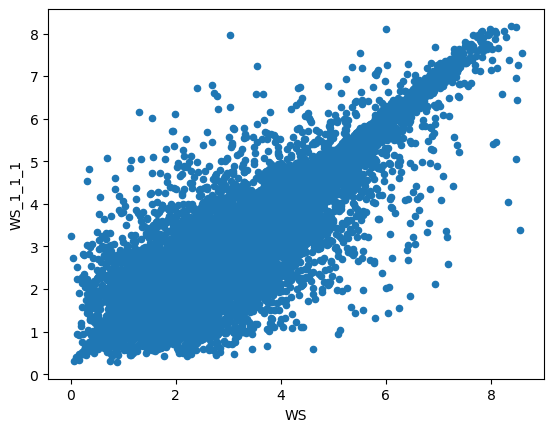

In [33]:
combined.loc['US-UTD', ['WS','WS_1_1_1']].dropna().plot(kind='scatter',x='WS',y='WS_1_1_1',)

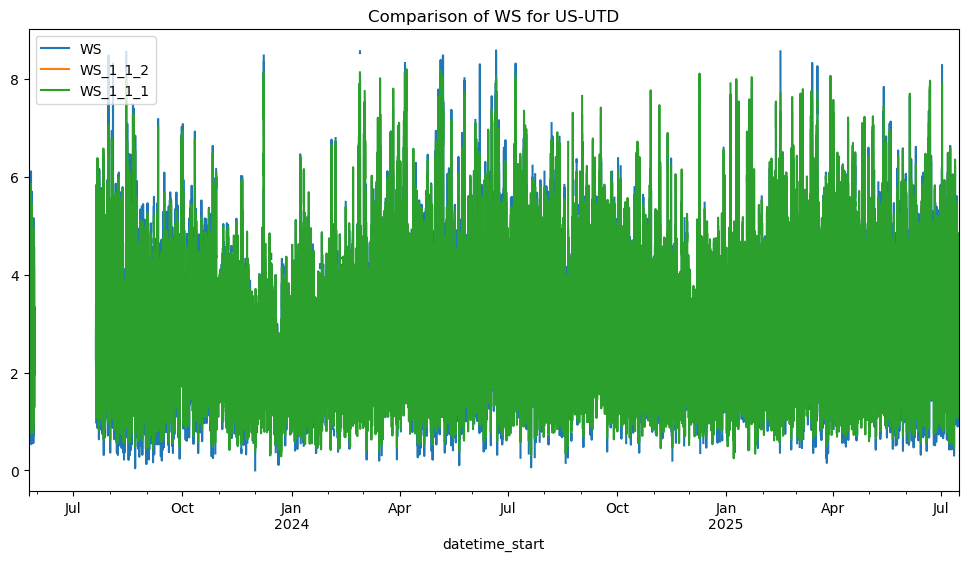

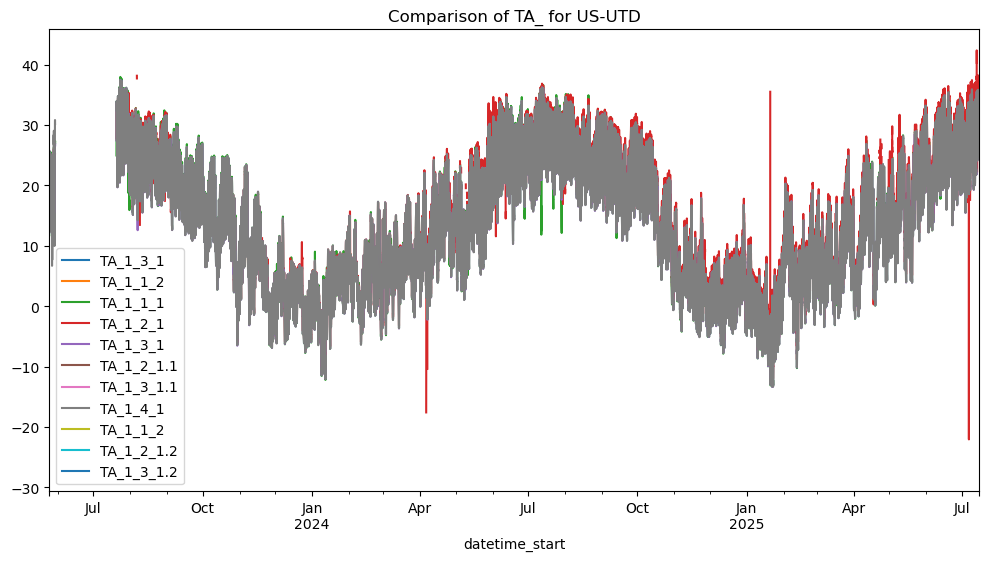

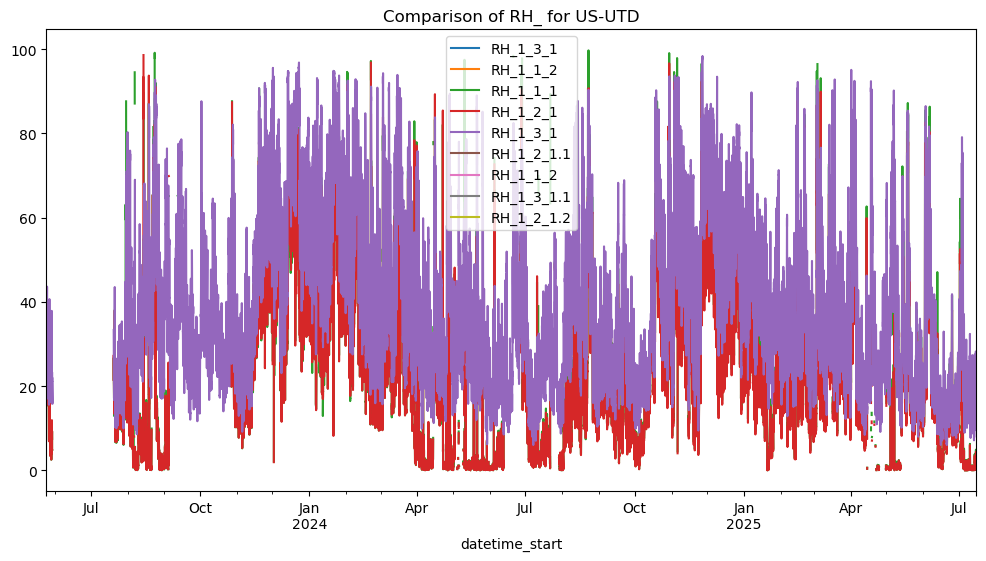

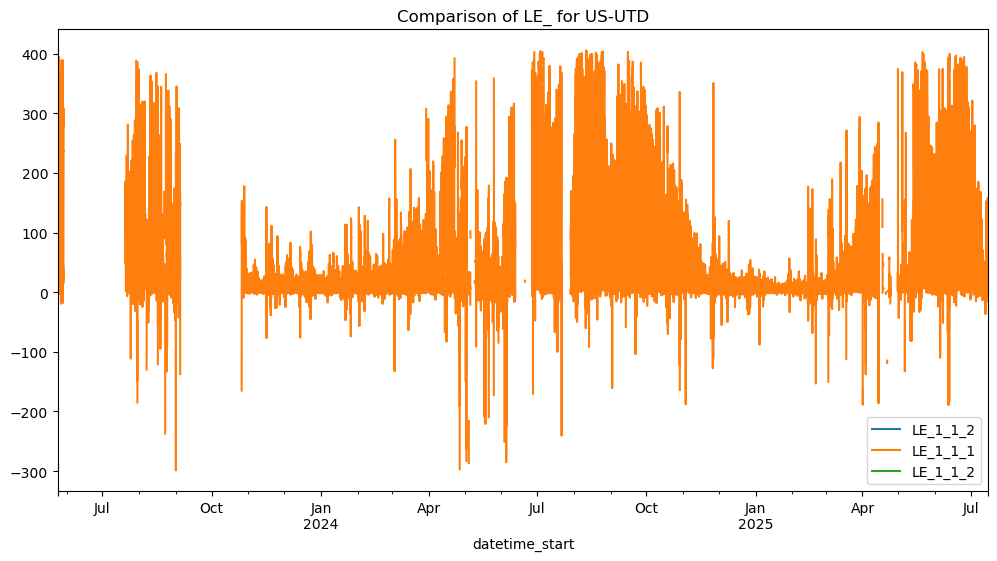

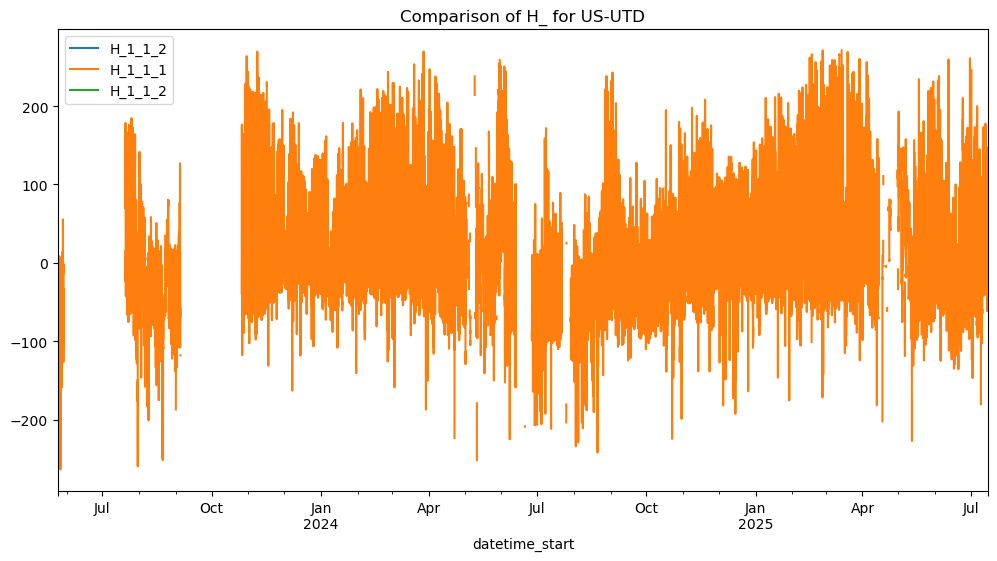

...

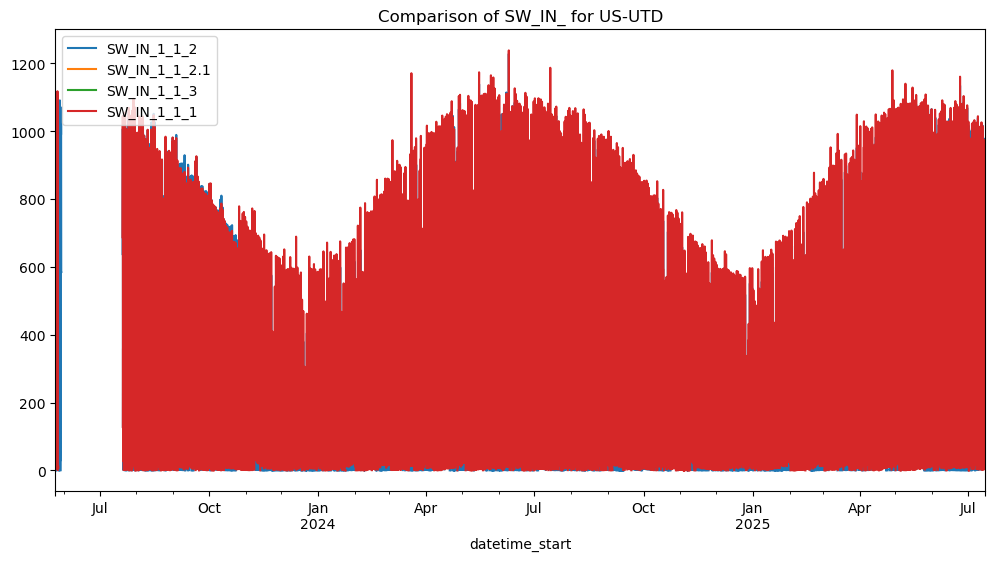

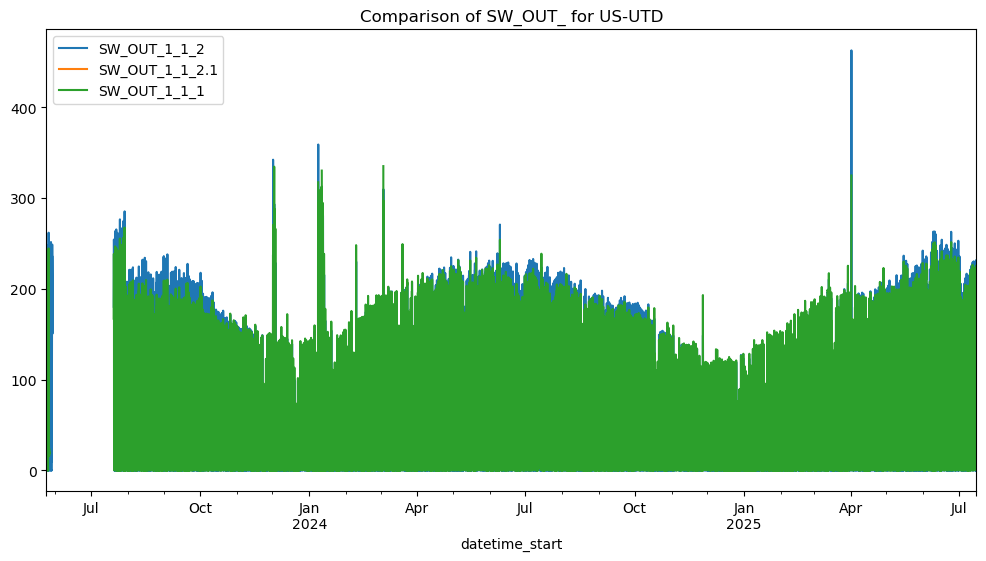

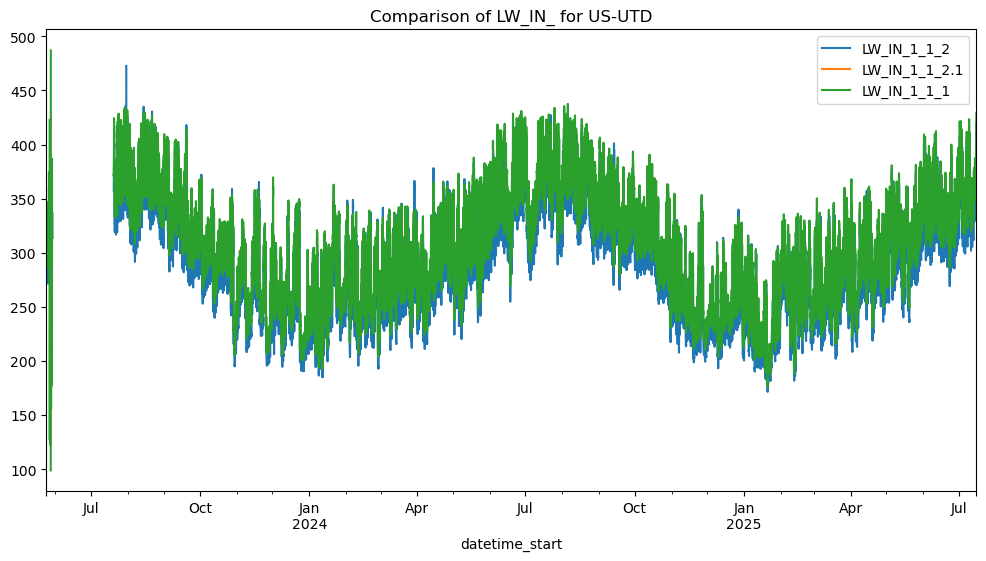

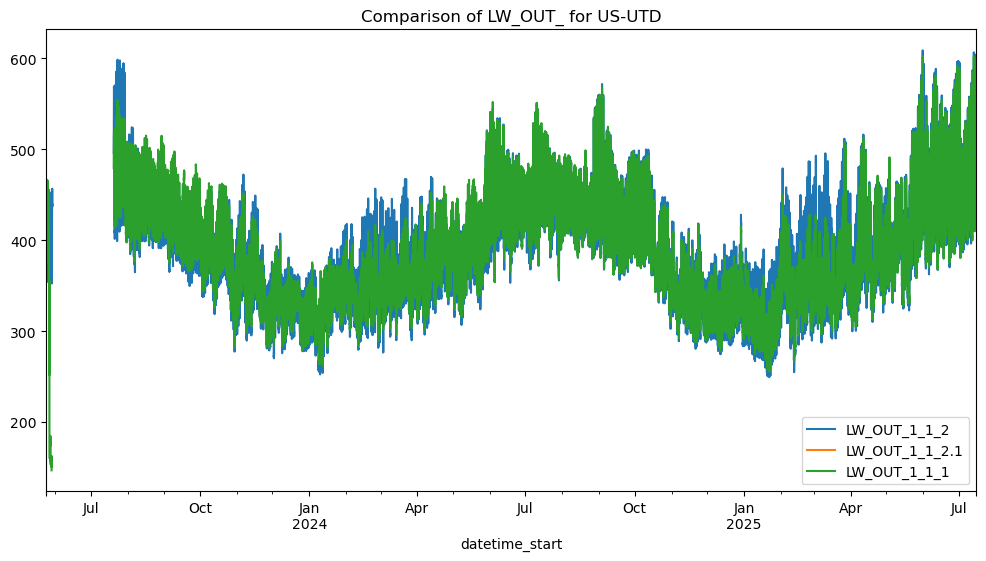

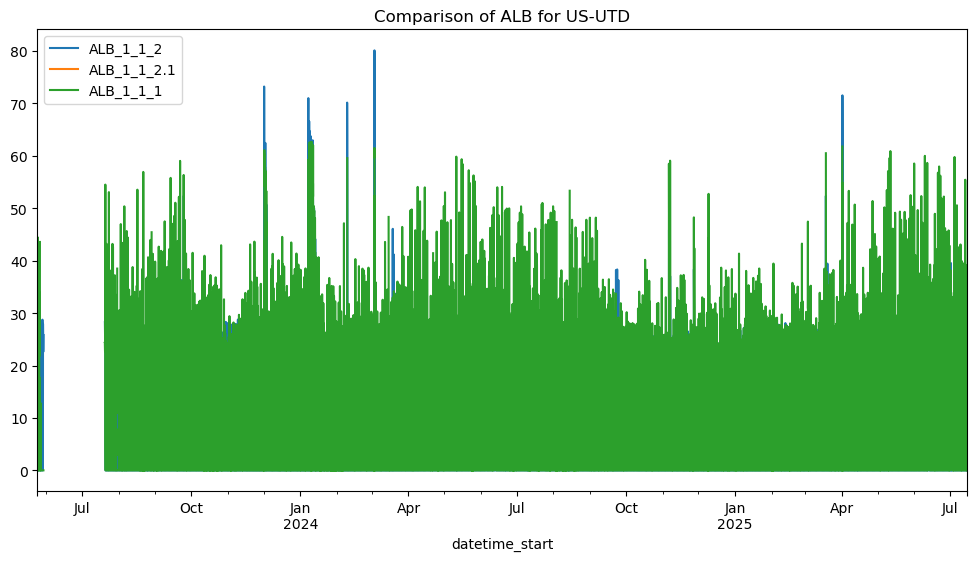

In [31]:
compare_cols = ["WS", 
                "TA_", 
                "RH_", 
                "LE_", 
                "H_", 
                "VPD", 
                "PA", 
                "WD", 
                "NETRAD", 
                "SW_IN_", 
                "SW_OUT_", 
                "LW_IN_", 
                "LW_OUT_", 
                "ALB"]

matches = {}
for i in compare_cols:
    values = []
    met_col = []
    eddy_col = []

    for col in met.columns:
        if 'MAX' not in col and 'SSITC' not in col:
            if col.startswith(i):
                values.append(col)
                met_col.append(col)

    for col in eddy.columns:
        if 'MAX' not in col and 'SSITC' not in col:
            if col.startswith(i):
                values.append(col)
                eddy_col.append(col)

    matches[i] = values
    if len(values) > 1:
        fig, ax = plt.subplots(figsize=(12, 6))
        plt.title(f"Comparison of {i} for US-UTD")
        for j in met_col:
            met.loc['US-UTD',j].replace(-9999,np.nan).plot(label=j,ax=ax)
        for k in eddy_col:
            eddy.loc['US-UTD',k].replace(-9999,np.nan).plot(label=k,ax=ax)
        plt.legend()





In [9]:
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.ensemble import IsolationForest
from collections import defaultdict

# --------------------------------------------------
# 1. LOAD  (needs pyarrow or fastparquet installed)
# --------------------------------------------------
met  = pd.read_parquet(raw_fold / "combined_met_dataset.parquet")
eddy = pd.read_parquet(raw_fold / "combined_eddy_dataset.parquet")

# If not already multi-indexed by (station, timestamp):
# met  = met.set_index(["station_id", "timestamp"]).sort_index()
# eddy = eddy.set_index(["station_id", "timestamp"]).sort_index()

# Keep only overlapping station–time rows
common_idx = met.index.intersection(eddy.index)
met, eddy  = met.loc[common_idx], eddy.loc[common_idx]

# --------------------------------------------------
# 2. DEFINE THE PREFIXES YOU WANT TO COMPARE
#    (fill this list in with your own)
# --------------------------------------------------
prefixes = ["WS", "TA", "RH", "LE", "H", "VPD", "PA", "WD", "NETRAD", "SW_IN", "SW_OUT", "LW_IN", "LW_OUT", "ALB"]

# --------------------------------------------------
# 3. BUILD A MATCH TABLE  {prefix -> [(met_col, eddy_col), …]}
# --------------------------------------------------
matches = defaultdict(list)

for p in prefixes:
    # columns that begin with that prefix
    met_cols  = [c for c in met.columns  if c.startswith(p)]
    eddy_cols = [c for c in eddy.columns if c.startswith(p)]

    # simplest strategy: look for *exact* column-name matches
    common = set(met_cols).intersection(eddy_cols)
    for col in common:
        matches[p].append((col, col))

    # fallback: if names differ after the prefix, pair by the suffix
    if not common:
        met_suffix  = {c[len(p):]: c for c in met_cols}
        eddy_suffix = {c[len(p):]: c for c in eddy_cols}
        for suf in met_suffix.keys() & eddy_suffix.keys():
            matches[p].append((met_suffix[suf], eddy_suffix[suf]))

# sanity check
if not any(matches.values()):
    raise ValueError("No columns matched with the given prefixes!")
else:
    print(f"Found {len(matches)} prefixes with matches:")
    for p, pairs in matches.items():
        print(f"  {p}: {len(pairs)} pairs")
        for mcol, ecol in pairs:
            print(f"    {mcol} ↔ {ecol}")

# --------------------------------------------------
# 4. COLLECT ALL DIFFERENCES INTO ONE DATAFRAME
#    (column names => "<prefix><suffix>_diff")
# --------------------------------------------------
diff_frames = []
for p, pairs in matches.items():
    for mcol, ecol in pairs:
        name = f"{mcol}_diff"          # keeps original met name for clarity
        diff_frames.append(
            (name, met[mcol] - eddy[ecol])
        )

# combine into a single MultiIndex-friendly DataFrame
diff = pd.concat(
    {name: series for name, series in diff_frames}, axis=1
)

abs_diff = diff.abs()

# --------------------------------------------------
# 5. OUTLIER METHODS
# --------------------------------------------------
# 5A. Z-score (3σ)
z_scores = abs_diff.groupby(level=0).transform(
    lambda g: (g - g.mean()) / g.std(ddof=0)
)
flags_z = z_scores > 3

# 5B. MAD (3.5× MAD)
def mad_flags(s, k=3.5):
    med = s.median()
    mad = np.median(np.abs(s - med))
    return np.abs(s - med) / (1.4826 * mad + 1e-9) > k

flags_mad = abs_diff.groupby(level=0).transform(mad_flags)

# 5C. Isolation Forest (multivariate, per station)
flags_if = pd.DataFrame(False, index=abs_diff.index, columns=abs_diff.columns)

for stn, g in abs_diff.groupby(level=0):
    X   = g.values
    ok  = np.any(~np.isnan(X), axis=1)
    if ok.sum() < 20:                # need enough rows to fit
        continue

    clf = IsolationForest(
        n_estimators=300,
        contamination=0.01,
        random_state=42,
    ).fit(X[ok])

    row_out = clf.predict(X[ok]) == -1   # → Boolean vector
    # broadcast to all columns
    flags_if.loc[g.index[ok], :] = np.repeat(
        row_out[:, None], g.shape[1], axis=1
    )

# --------------------------------------------------
# 6. QUICK SUMMARY  (how many flags per variable)
# --------------------------------------------------
summary = (
    pd.DataFrame({
        "Zscore": flags_z.sum(),
        "MAD":    flags_mad.sum(),
        "IsoF":   flags_if.sum(),
    })
    .sort_index()
)
print(summary.head())

# --------------------------------------------------
# 7. OPTIONAL:  EXPORT OR APPLY MASK
# --------------------------------------------------
# Example: mask out any value flagged by *any* method
combined_flags = flags_z | flags_mad | flags_if
clean_met  = met.where(~combined_flags)  # replaces flagged cells with NaN


Found 6 prefixes with matches:
  TA: 2 pairs
    TA_1_1_2 ↔ TA_1_1_2
    TA_1_3_1 ↔ TA_1_3_1
  RH: 2 pairs
    RH_1_3_1 ↔ RH_1_3_1
    RH_1_1_2 ↔ RH_1_1_2
  LE: 1 pairs
    LE_1_1_2 ↔ LE_1_1_2
  H: 1 pairs
    H_1_1_2 ↔ H_1_1_2
  VPD: 1 pairs
    VPD_1_1_2 ↔ VPD_1_1_2
  PA: 1 pairs
    PA_1_1_2 ↔ PA_1_1_2


c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\paulinkenbrandt\.conda\envs\py3

               Zscore  MAD  IsoF
H_1_1_2_diff        0    0     0
LE_1_1_2_diff       0    0     0
PA_1_1_2_diff       0    0     0
RH_1_1_2_diff       0    0     0
RH_1_3_1_diff       0    0     0


In [10]:
met_cols

['ALB_1_1_2', 'ALB_1_1_2.1']

In [68]:
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.ensemble import IsolationForest

# ---------- 1. LOAD ----------
met   = pd.read_parquet(raw_fold /"combined_met_dataset.parquet")   # needs pyarrow or fastparquet
eddy  = pd.read_parquet(raw_fold /"combined_eddy_dataset.parquet")

# If your indices aren’t yet a MultiIndex (station, time) do this once:
# met  = met.set_index(["station_id","timestamp"]).sort_index()
# eddy = eddy.set_index(["station_id","timestamp"]).sort_index()

# Keep only the overlapping stations & times
common_idx = met.index.intersection(eddy.index)
met  = met.loc[common_idx]
eddy = eddy.loc[common_idx]

# ---------- 2. IDENTIFY MATCHING VARIABLES ----------
common_cols = met.columns.intersection(eddy.columns)
if common_cols.empty:
    raise ValueError("No shared measurement names between the two datasets!")

# Optionally drop columns that are integer-typed (often flags / counters)
keep_float = [c for c in common_cols if np.issubdtype(met[c].dtype, np.floating)]
met  = met[keep_float]
eddy = eddy[keep_float]

# ---------- 3. STACK THE TWO SOURCES FOR EZ COMPARISON ----------
diff = met - eddy              # sign tells you which source is higher
abs_diff = diff.abs()

# ---------- 4A. Z-SCORE BASED OUTLIERS ----------
z_scores = abs_diff.groupby(level=0).transform(  # compute σ station-by-station
    lambda g: (g - g.mean()) / g.std(ddof=0)
)
outliers_z = z_scores > 3        # boolean DF same shape as diff

# ---------- 4B. MAD BASED OUTLIERS ----------
def mad_based_flags(series, k=3.5):
    med = series.median()
    mad = np.median(np.abs(series - med))
    # 1.4826 converts MAD to σ for a normal dist.
    return np.abs(series - med) / (1.4826 * mad + 1e-9) > k

outliers_mad = abs_diff.groupby(level=0).transform(mad_based_flags)

# ---------- 4C. ISOLATION FOREST (multivariate) ----------
iso_out = {}
for stn, g in abs_diff.groupby(level=0):

    X = g.values
    mask = np.any(~np.isnan(X), axis=1)          # rows with ≥1 real number
    flags = pd.DataFrame(False, index=g.index, columns=g.columns)

    if mask.sum() >= 20:                         # enough samples to train
        clf = IsolationForest(
            contamination=0.01,
            n_estimators=300,
            random_state=42,
        ).fit(X[mask])

        row_flags = clf.predict(X[mask]) == -1   # 1-D Boolean (outlier rows)

        # --- broadcast row_flags to full (n_rows_selected × n_columns) matrix
        flags.iloc[mask, :] = np.repeat(
            row_flags[:, None], g.shape[1], axis=1
        )

    iso_out[stn] = flags

outliers_iso = pd.concat(iso_out)

# ---------- 5. SUMMARIZE ----------
summary = (
    pd.DataFrame({
        "z_score":  outliers_z.sum(),
        "MAD":      outliers_mad.sum(),
        "iForest":  outliers_iso.sum()
    })
    .rename_axis("variable")
)
print(summary.head())


c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\paulinkenbrandt\.conda\envs\py313\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
c:\Users\paulinkenbrandt\.conda\envs\py3

           z_score  MAD  iForest
variable                        
T_CANOPY         0    0        4
SWC_3_1_1        0    0        4
K_3_1_1          0    0        4
TS_3_1_1         0    0        4
EC_3_1_1         0    0        4


In [69]:
summary

,z_score,MAD,iForest
variable,,,
T_CANOPY,0,0,4
SWC_3_1_1,0,0,4
K_3_1_1,0,0,4
TS_3_1_1,0,0,4
EC_3_1_1,0,0,4
...,...,...,...
TA_1_1_2,0,0,4
RH_1_1_2,0,0,4
D_SNOW,0,0,4


Compile files from each station into a a single dataframe.

In [ ]:
cdf = pd.concat(comp_edd_df, axis=0)
cdf.index.set_names(['stationid','datetime_start'],inplace=True)
#cdf.rename(columns={'level_0':'stationid'},inplace=True)
#cdf.to_parquet('../station_data/all_data.parquet')
for col in cdf.columns:
    cdf.rename(columns={col:col.lower()},inplace=True)

Save to Parquet

In [ ]:
cdf.to_parquet('../../station_data/all_eddy_data.parquet')

OSError: Cannot save file into a non-existent directory: '..\..\station_data'

In [ ]:

comp_met_df = {}
root_dir = "C:/Users/paulinkenbrandt/Documents/GitHub/MicroMet/src/micromet/data/"
config_path = root_dir + "reformatter_vars.yml"
var_limits_csv = root_dir + "extreme_values.csv"
am = micromet.AmerifluxDataProcessor(config_path, logger)


for key, value in site_folders.items():

    print(key)
    raw_fold = pathlib.Path('G:/Shared drives/UGS_Flux/Data_Downloads/')
    raw_data = am.raw_file_compile(raw_fold, value, search_str = "*Statistics_AmeriFlux*.dat")
    if raw_data is not None:
        am_data = micromet.Reformatter(
                                       config_path=config_path,
                                       var_limits_csv= var_limits_csv,
                                       drop_soil=False,
                                       logger=logger,
                                       )
        am_df = am_data.prepare(raw_data, data_type="met")
        #am_df = am_data.et_data
        comp_met_df[key] = am_df

        #am_df.to_csv(f"../../station_data/{key}_HH_{am_df['TIMESTAMP_START'].values[0]:}_{am_df['TIMESTAMP_END'].values[-1]:}.csv")

        



In [ ]:
ddf.columns = ddf.columns.str.lower()

In [ ]:
soildfs

for old_col, new_col in mapping.items():
    if str(old_col).lower() in soildfs.columns.str.lower():
        if str(new_col).lower() in soildfs.columns.str.lower():
            soildfs[new_col.lower()] = soildfs[[old_col.lower(), new_col.lower()]].max(axis=1)
            soildfs = soildfs.drop(old_col.lower(), axis=1)
        else:
            soildfs = soildfs.rename(columns={old_col.lower(): new_col.lower()})
    elif str(old_col).lower()+"_eddy" in soildfs.columns.str.lower():
        print(f"Found {old_col} eddy column")
        if str(new_col).lower()+"_eddy" in soildfs.columns.str.lower():
            soildfs[new_col.lower()] = soildfs[[old_col.lower()+"_eddy", new_col.lower()+"_eddy"]].max(axis=1)
            soildfs = soildfs.drop(old_col.lower()+"_eddy", axis=1)
        else:
            soildfs = soildfs.rename(columns={old_col.lower()+"_eddy": new_col.lower()})
    elif str(new_col).lower()+"_eddy" in soildfs.columns.str.lower():
        if str(new_col).lower() in soildfs.columns.str.lower():
            soildfs[new_col.lower()] = soildfs[[new_col.lower()+"_eddy", new_col.lower()+"_eddy"]].max(axis=1)
            soildfs = soildfs.drop(new_col.lower()+"_eddy", axis=1)
            print(f"Found {new_col} eddy column")
        else:
            print(f"Found {new_col} eddy column")
            soildfs = soildfs.rename(columns={new_col.lower()+"_eddy": new_col.lower()})
        


In [ ]:
ddf = pd.concat(comp_met_df, axis=0)
ddf.index.set_names(['stationid','datetime_start'],inplace=True)
#cdf.rename(columns={'level_0':'stationid'},inplace=True)
#cdf.to_parquet('../station_data/all_data.parquet')
for col in ddf.columns:
    ddf.rename(columns={col:col.lower()},inplace=True)

In [ ]:
ddf[~ddf['vwc_2_7_1'].isna()]

In [ ]:
ddf.iloc[0:1,:].to_clipboard()

In [ ]:
import re

soilcols = [col.lower() for col in am_data.MATH_SOILS_V2]
pattern = re.compile(r"2_1_1|1_2_1|1_1_2")
# Print matching columns
matching_cols = [col for col in soilcols if pattern.search(col)]
# Remove them from the original list
soilcols = [col for col in soilcols if not pattern.search(col)]

        
soildfs = pd.merge(ddf,cdf[soilcols],how='left',on=['stationid','datetime_start'],suffixes=(None,'_eddy'))
soildfs

for col in cdf.columns:
    if col in soilcols:
        cdf.drop(columns=col,inplace=True)  # drop the soil columns from the main dataframe

cdf.to_parquet('../../station_data/all_eddy_data.parquet')

soildfs.to_parquet('../../station_data/all_soil_data.parquet')

ddf.to_parquet('../../station_data/all_met_data.parquet')

In [ ]:
cdf = pd.read_parquet('../../station_data/all_eddy_data.parquet')


In [ ]:
cdf.columns

In [ ]:
soildfs = pd.read_parquet('../../station_data/all_soil_data.parquet')
utd_soilt = soildfs.loc['US-UTD'][['ts_3_1_1','ts_3_2_1','ts_3_3_1']].replace(-9999,np.nan)
utd_soilt = utd_soilt[utd_soilt.index >= '2024-07-01']#.resample('30T').mean()
utd_soilt['ts_3_1_1'].plot()
utd_soilt['ts_3_2_1'].shift(-1).plot()
utd_soilt['ts_3_3_1'].shift(-5).plot()
plt.axvline('2024-07-04 15:00',color='r')
#plt.xlim('2024-07-01','2024-07-08')
#plt.ylim(10,35)
plt.grid(True, which='minor')

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.signal import correlate

# Function to decompose the seasonal component
def extract_seasonal(ts, period):
    decomposition = seasonal_decompose(ts, model='additive', period=period)
    return decomposition.seasonal

# Function to calculate lag between two seasonal series using cross-correlation
def calculate_lag(seasonal1, seasonal2):
    n = len(seasonal1)
    correlation = correlate(seasonal1 - np.mean(seasonal1), seasonal2 - np.mean(seasonal2), mode='full')
    lags = np.arange(-n + 1, n)
    lag = lags[np.argmax(correlation)]
    return lag, correlation, lags

ts1 = utd_soilt['ts_3_2_1']
ts2 = utd_soilt['ts_3_3_1']
#utd_soilt['ts_3_3_1'].shift(-5).plot()


# Extract seasonal components
seasonal1 = extract_seasonal(ts1, period=48)
seasonal2 = extract_seasonal(ts2, period=48)

# Calculate lag
lag, correlation, lags = calculate_lag(seasonal1.dropna(), seasonal2.dropna())

# Output
print(f"Calculated lag: {lag/2} hours")

# Plot seasonal components and correlation
fig, ax = plt.subplots(3, 1, figsize=(10, 8))

seasonal1.plot(ax=ax[0], label='Seasonal Component 1')
seasonal2.plot(ax=ax[0], label='Seasonal Component 2')
ax[0].legend()
ax[0].set_title('Seasonal Components')
ax[0].set_xlim(pd.to_datetime('2024-07-01'),pd.to_datetime('2024-07-08'))
ax[0].grid(True)

ax[1].plot(lags, correlation)
ax[1].set_title('Cross-Correlation')
ax[1].set_xlabel('Lag (hours)')
ax[1].set_ylabel('Correlation')
ax[1].set_xlim(-10, 10)
ax[1].grid(True)

ax[2].plot(seasonal1.index, seasonal1, label='Series 1')
ax[2].plot(seasonal2.index + pd.Timedelta(hours=lag/2), seasonal2, label='Series 2 (Shifted)')
ax[2].legend()
ax[2].set_title(f'Series alignment (Lag: {lag/2} hours)')
ax[2].set_xlim(pd.to_datetime('2024-07-01'),pd.to_datetime('2024-07-08'))
ax[2].grid(True)
plt.tight_layout()
plt.show()



In [ ]:
cdf = pd.read_parquet('../../station_data/all_eddy_data.parquet')
ddf = pd.read_parquet('../../station_data/all_met_data.parquet')

for col in cdf.columns:
    if col in ddf.columns:
        print(col)


In [ ]:
ddf.head(10).to_clipboard()

In [ ]:
series = ddf.loc['US-UTD','t_si111_body'].replace(-9999,np.nan)
series.plot()
series.diff().plot()
new_series = series[series.diff()<2].diff().cumsum()
new_series.plot()

In [ ]:
config = configparser.ConfigParser()

config.read('../../secrets/config.ini')

from sqlalchemy import create_engine
import urllib.parse
host = config['DEFAULT']['ip']
pw = config['DEFAULT']['pw']
user = config['DEFAULT']['login']

encoded_password = urllib.parse.quote_plus(pw)

def postconn_et(encoded_password, host='localhost',user='postgres',port='5432',db='groundwater', schema = 'groundwater'):
    connection_text = "postgresql+psycopg2://{:}:{:}@{:}:{:}/{:}?gssencmode=disable".format(user,encoded_password,host,port,db)
    return create_engine(connection_text, connect_args={'options': '-csearch_path={}'.format(schema)})


engine = postconn_et(encoded_password, host=host, user=user)

In [ ]:
cdf.to_sql(name = 'amfluxeddy',
           schema='groundwater',
           con=engine,
           if_exists='replace',
           chunksize=2000)

In [ ]:
for col in soildfs.columns:
    print(f"amfluxmet.{col},")

In [ ]:
soildfs.to_sql(name = 'amfluxmet',
           schema='groundwater',
           con=engine,
           if_exists='replace',
           chunksize=2000)